# Representative Periods

## Load Packages

In [1]:
using CSV, DataFrames
using Statistics
using Plots
using Clustering
using Random
include(joinpath("..","src","utils.jl"))

getFullCandidateLines

## Load Data

In [2]:
# time-series data
loads = CSV.read(joinpath("..","data","NordicBaltic","load.csv"),DataFrame)
winds = CSV.read(joinpath("..","data","NordicBaltic","wind.csv"),DataFrame)
offshores = CSV.read(joinpath("..","data","NordicBaltic","wind_offshore.csv"),DataFrame)
pvs = CSV.read(joinpath("..","data","NordicBaltic","pv.csv"),DataFrame)
rors = CSV.read(joinpath("..","data","NordicBaltic","ror.csv"),DataFrame)
reservoirs = CSV.read(joinpath("..","data","NordicBaltic","reservoir.csv"),DataFrame)
ts_dicts = Dict(
    "load"=>loads,
    "wind"=>winds,
    "pv"=>pvs,
    "ror"=>rors,
    "offshore"=>offshores,
    "reservoir"=>reservoirs,
)
# network data
nodes = CSV.read(joinpath("..","data","NordicBaltic","nodes.csv"),DataFrame)

Row,id,name,v_nom,longitude,latitude,area
,Int64,String15,Int64,Float64,Float64,Int64
1,1,Denmark,380,10.1805,55.6601,1
2,2,Estonia,380,25.9342,58.7472,2
3,3,Finland,380,26.3944,62.0538,1
4,4,Latvia,380,25.9562,57.0921,2
5,5,Lithuania,380,23.9365,54.4277,2
6,6,Sweden,380,14.8453,56.1738,1
7,7,Norway,380,8.4689,60.472,1


## Drop date column

In [3]:
for key in keys(ts_dicts)
    ts_dicts[key] = select(ts_dicts[key],Not(:t))
end

## Plot load for each country

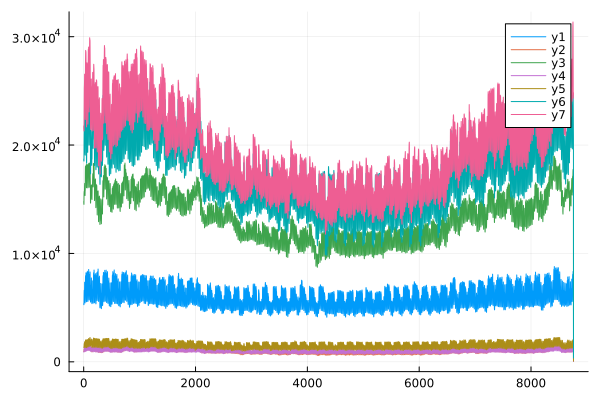

In [4]:
plt = plot()
for name in nodes.name
    plot!(ts_dicts["load"][:,name])
end
plt

## Drop last hour

In [5]:
for key in keys(ts_dicts)
    ts_dicts[key] = ts_dicts[key][1:end-1,:]
end

## Plot load again

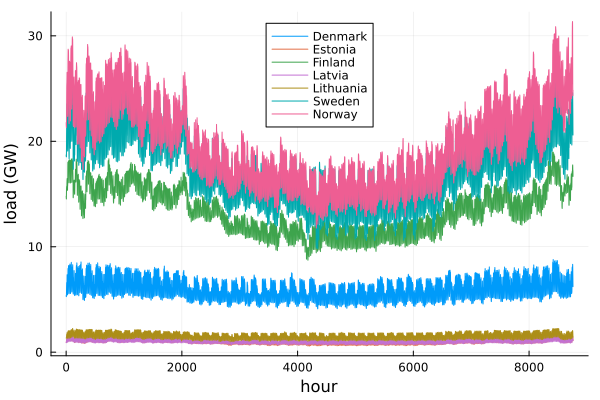

In [6]:
plt = plot()
for name in nodes.name
    plot!(plt,ts_dicts["load"][:,name]./1e3, label=name)
end
plot!(legend=:top, ylabel="load (GW)", xlabel="hour")
plt

## Plot VREs and load together

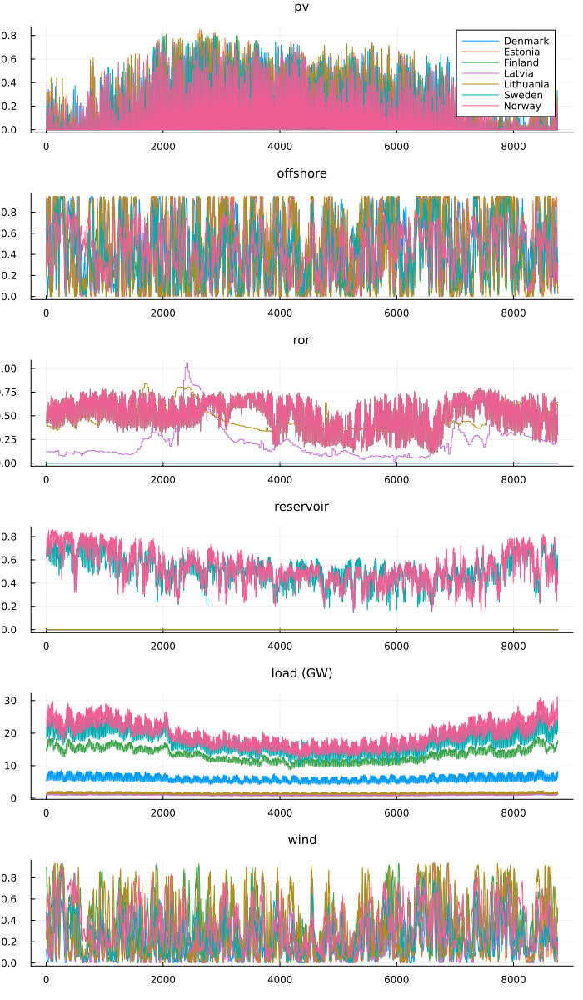

In [7]:
plt = Dict()
for key in keys(ts_dicts)
    if key != "load"
        plt[key] = plot(title=key, titlefontsize=10)
    else
        plt[key] = plot(title="load (GW)", titlefontsize=10)
    end
    for node in nodes.name
        if key == "pv"
            plot!(plt[key], ts_dicts[key][:,node], label=node)
        elseif key == "load"
            plot!(plt[key], ts_dicts[key][:,node]./1000, label=:none)
        else
            plot!(plt[key], ts_dicts[key][:,node], label=:none)
        end
    end
end
plot([value for value in values(plt)]...,layout=(6,1))
plot!(size=(700,1200))
ts_dicts_plot = plot!(legend=:topright)
# savefig(ts_dicts_plot,joinpath("..","figs","raw_time_series.png"))

## Get 10 representative periods

In [8]:
kperiods = getKRepresentativePeriods(ts_dicts,nodes;k=10,norm="minmax",seed=910)

Row,id,pvDenmark,pvEstonia,pvFinland,pvLatvia,pvLithuania,pvSweden,pvNorway,offshoreDenmark,offshoreEstonia,offshoreFinland,offshoreLatvia,offshoreLithuania,offshoreSweden,offshoreNorway,rorDenmark,rorEstonia,rorFinland,rorLatvia,rorLithuania,rorSweden,rorNorway,reservoirDenmark,reservoirEstonia,reservoirFinland,reservoirLatvia,reservoirLithuania,reservoirSweden,reservoirNorway,loadDenmark,loadEstonia,loadFinland,loadLatvia,loadLithuania,loadSweden,loadNorway,windDenmark,windEstonia,windFinland,windLatvia,windLithuania,windSweden,windNorway,w
,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64
1,1,0.508058,0.535373,0.515401,0.516711,0.504202,0.519713,0.457162,0.387896,0.160015,0.254577,0.134196,0.136285,0.253889,0.411563,0.0,0.0,0.581288,0.362037,0.51203,0.0,0.581288,0.0,0.0,0.0,0.0,0.0,0.520029,0.496523,6442.12,1084.57,12816.6,1240.72,1740.02,17841.5,19121.2,0.131362,0.0993806,0.226879,0.0771312,0.119285,0.164031,0.295837,514
2,2,0.0708663,0.0442113,0.0392227,0.0535516,0.0640307,0.0531153,0.054652,0.782152,0.907335,0.724466,0.919894,0.90531,0.781233,0.599798,0.0,0.0,0.59364,0.207909,0.434952,0.0,0.59364,0.0,0.0,0.0,0.0,0.0,0.574532,0.618595,6794.51,1179.48,14578.3,1249.01,1780.49,20108.6,22221.2,0.377957,0.540119,0.622305,0.590274,0.759754,0.562103,0.588574,662
3,3,0.0582573,0.0580034,0.0429195,0.0616535,0.0664415,0.0565149,0.0661639,0.369414,0.169419,0.261245,0.146152,0.148584,0.266543,0.413563,0.0,0.0,0.63327,0.217655,0.522833,0.0,0.63327,0.0,0.0,0.0,0.0,0.0,0.641546,0.664656,7155.25,1305.62,15956.2,1363.72,1896.27,22494.3,24856.3,0.126469,0.102326,0.318489,0.0900439,0.145106,0.197115,0.325139,1112
4,4,0.425821,0.393351,0.384205,0.384445,0.40127,0.405191,0.380913,0.506355,0.729116,0.451625,0.767301,0.760131,0.535781,0.411625,0.0,0.0,0.570858,0.228338,0.443639,0.0,0.570858,0.0,0.0,0.0,0.0,0.0,0.497305,0.480138,6333.15,1041.96,12471.2,1188.72,1697.77,17343.0,18921.8,0.222561,0.294377,0.342288,0.33215,0.511886,0.319674,0.354755,692
5,5,0.00849376,0.0109067,0.0130091,0.0104225,0.0101505,0.0103368,0.0109525,0.307924,0.170725,0.199297,0.186531,0.191107,0.245857,0.337044,0.0,0.0,0.414462,0.204292,0.435785,0.0,0.414462,0.0,0.0,0.0,0.0,0.0,0.451293,0.453145,5070.37,829.232,11876.3,908.183,1298.49,14770.4,16245.8,0.0969484,0.0940881,0.231506,0.0916059,0.172269,0.162778,0.222322,1359
6,6,0.0164172,0.0164806,0.0188646,0.0165511,0.0168716,0.0173558,0.0179075,0.373841,0.639747,0.397405,0.710199,0.696696,0.443615,0.317978,0.0,0.0,0.442087,0.234289,0.455472,0.0,0.442087,0.0,0.0,0.0,0.0,0.0,0.44466,0.456349,5225.47,860.486,12256.0,933.758,1328.81,15514.3,17267.8,0.139128,0.243121,0.339018,0.303724,0.503534,0.244849,0.237561,951
7,7,0.035627,0.0322112,0.0315971,0.0298766,0.0299118,0.0320896,0.0343066,0.698299,0.24952,0.330234,0.221904,0.232807,0.378047,0.567705,0.0,0.0,0.511035,0.279224,0.490298,0.0,0.511035,0.0,0.0,0.0,0.0,0.0,0.505825,0.50807,5936.04,1018.33,13762.7,1070.67,1516.96,17938.6,19753.1,0.290582,0.148922,0.355496,0.12956,0.216958,0.297659,0.479111,943
8,8,0.0119022,0.0129652,0.0118595,0.012127,0.0130151,0.0128596,0.0107002,0.745366,0.819245,0.646996,0.843482,0.832522,0.699828,0.580584,0.0,0.0,0.401957,0.187868,0.41814,0.0,0.401957,0.0,0.0,0.0,0.0,0.0,0.426785,0.445563,5271.62,859.15,12415.4,921.094,1323.83,15391.0,17510.5,0.328356,0.405224,0.564242,0.425069,0.599192,0.484107,0.518429,826
9,9,0.314177,0.311116,0.308086,0.306749,0.323626,0.307955,0.28121,0.333239,0.215185,0.187962,0.224826,0.217433,0.237444,0.333338,0.0,0.0,0.550534,0.153686,0.388373,0.0,0.550534,0.0,0.0,0.0,0.0,0.0,0.511792,0.490871,6145.23,1000.69,11958.8,1155.3,1659.08,16543.1,17573.6,0.115103,0.0950087,0.148384,0.0953518,0.155569,0.145616,0.24075,710


## Norway load duration curve: raw vs rep. periods

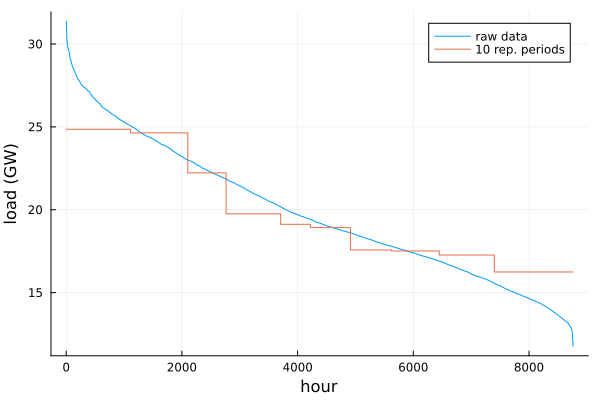

In [9]:
stepsNorwayLoad, step_hoursNorwayload = getDurationCurve(kperiods;node="Norway",type="load")
plot(sort(loads[:,"Norway"],rev=true)./1e3,label="raw data", ylabel="load (GW)")
plot!(vcat(0,stepsNorwayLoad),vcat(step_hoursNorwayload[1],step_hoursNorwayload)./1e3,linetype=:steppre,label="10 rep. periods", xlabel="hour")

## Norway inflow duration curve: raw vs rep. periods

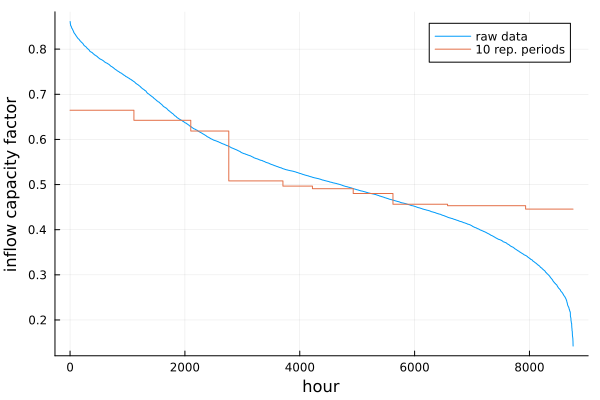

In [10]:
stepsNorwayReservoir, step_hoursNorwayReservoir = getDurationCurve(kperiods;node="Norway",type="reservoir")
plot(sort(reservoirs[:,"Norway"],rev=true),label="raw data", ylabel="inflow capacity factor")
plot!(vcat(0,stepsNorwayReservoir),vcat(step_hoursNorwayReservoir[1],step_hoursNorwayReservoir),linetype=:steppre,label="10 rep. periods", xlabel="hour")

## Export data

In [11]:
CSV.write(joinpath("..","data","NordicBaltic","kperiods.csv"),kperiods)

"../data/NordicBaltic/kperiods.csv"